# 牧原&汇兴生长期望曲线拟合


参考目标

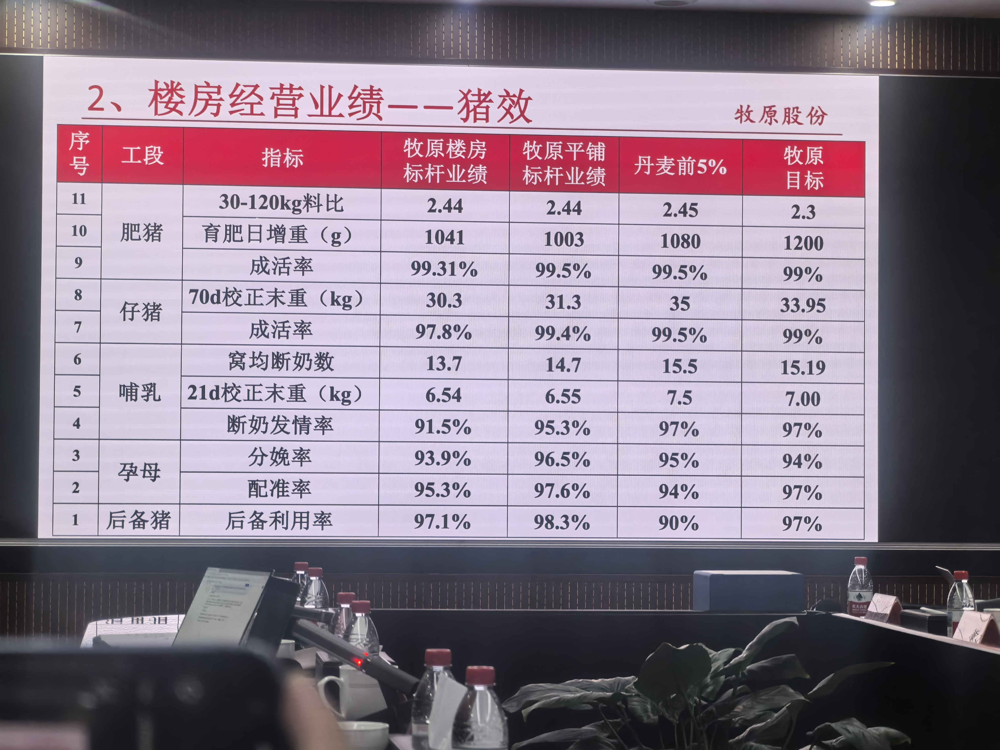

牧原日龄-体重目标曲线（log-log二项拟合）
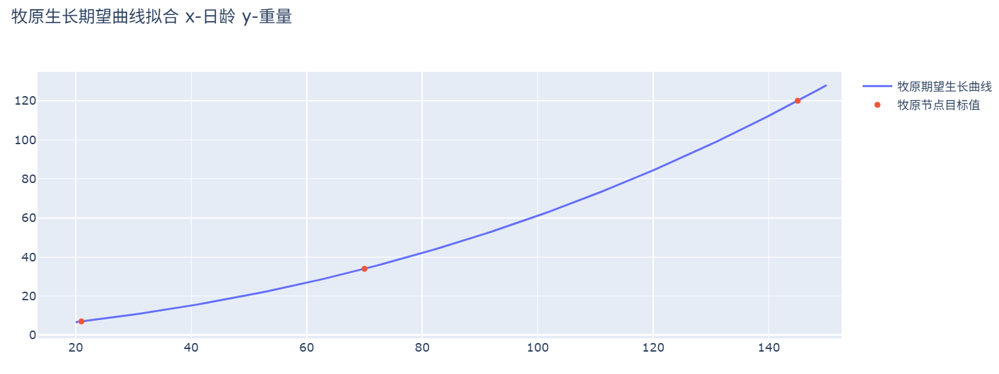

In [106]:
from feed_analysis.config.path import PATH_DATA,PATH_FEED_PROCESSED

# 1 牧原生长曲线

模型结构：采用Gompertz模型

Gompertz 模型是一种经典的 S 型（sigmoid）增长模型，广泛用于描述 **“先慢–后快–再慢”的增长过程，尤其适合生物、生长与累积过程**

函数：y(x)=L⋅exp(−exp(−k(x−x0​)))

| 参数    | 含义       | 直观解释               |
| ----- | -------- | ------------------ |
| (L)   | 上限 / 饱和值 | 理论最大值（如最终体重、最大累积量） |
| (k)   | 增长速率     | 增长“陡峭程度”           |
| (x_0) | 拐点       | 增长最快的时刻            |


In [107]:
import pandas as pd

# 创建牧原目标值数据（数据来源：牧原交流-指标展示）
df_my = pd.DataFrame({
    'age': [21, 70, 145],
    'weight': [7, 33.95, 120],
})

x = df_my['age'].values
y = df_my['weight'].values

In [108]:
from feed_analysis.growing_fit.gompertz import fit_gompertz_through_3points, fit_gompertz_fixed_x0, fit_gompertz_fixed_L, fit_gompertz, gompertz_pred

gompertz_params_my = fit_gompertz(x, y)                     # 根据三点拟合，自动计算 L      
# gompertz_params_my = fit_gompertz_fixed_L(x, y, L=200)      # 固定L，拟合另外两个曲线

print(gompertz_params_my)
import numpy as np
# 计算期望体重
df_my_fit = pd.DataFrame({'age':np.arange(20, 151, 1)})
df_my_fit['weight_fit'] = gompertz_pred(df_my_fit['age'].values, gompertz_params_my)
df_my_fit['day_weight_fit'] = df_my_fit['weight_fit'].diff()

{'L': np.float64(333.7540269813525), 'k': np.float64(0.010719167783362774), 'x0': np.float64(147.11340870959313), 'cov': array([[inf, inf, inf],
       [inf, inf, inf],
       [inf, inf, inf]])}


D:\Work\work-error-detect\src\feed_analysis\growing_fit\gompertz.py:166: OptimizeWarning:

Covariance of the parameters could not be estimated



In [109]:
# 总体重-日龄
import plotly.graph_objects as go
fig = go.Figure()

fig.add_trace(go.Scatter(x=df_my_fit['age'], y=df_my_fit['weight_fit'], mode='lines', name='牧原期望生长曲线'))
fig.add_trace(go.Scatter(x=df_my['age'], y=df_my['weight'], mode='markers', name='牧原节点目标值'))
fig.update_layout(title='牧原生长期望曲线拟合 x-日龄 y-重量')


In [110]:
# 日增重-日龄
import plotly.graph_objects as go
fig = go.Figure()

fig.add_trace(go.Scatter(x=df_my_fit['age'], y=df_my_fit['day_weight_fit'], mode='lines+markers', name='牧原期望生长曲线'))
fig.update_layout(title='牧原日增重期望曲线拟合 x-日龄 y-日增重')


# 2 汇兴vs牧原

汇兴采用的数据是4栋2单元饲喂数据

In [111]:
# --------- 读取汇兴三类数据 ---------------
import pandas as pd

# 1. 汇兴标准
df_hx_std = pd.read_excel(PATH_DATA / 'ori' / '汇兴牧业-标准日龄饲料.xlsx', header=1)

# 2. 实际养殖数据
df_hx_curr = pd.read_excel(PATH_DATA / 'growth' / '汇兴4栋生长数据-poly2-log拟合.xlsx')[['age', 'avg_food_kg', 'day_fcr', 'day_weight', 'weight']]

# 3. 实际拟合延长数据
df_hx_curr_fit = pd.read_excel(PATH_DATA / 'growth' / '汇兴4栋生长数据-poly2-log拟合(延长).xlsx')
df_hx_curr_fit = df_hx_curr_fit.loc[df_hx_curr_fit['day_weight_fit'] > 0, :]

# 3. 实际拟合延长数据（3栋）
df_hx_curr3_fit = pd.read_excel(PATH_DATA / 'growth' / '汇兴3栋生长数据-poly2-log拟合(延长).xlsx')
df_hx_curr3_fit = df_hx_curr3_fit.loc[df_hx_curr3_fit['day_weight_fit'] > 0, :]

In [112]:
# 日龄-体重对比
import plotly.graph_objects as go
fig = go.Figure()

# 去掉体重大于125kg的值
df_my_fit = df_my_fit.loc[df_my_fit['weight_fit'] < 125, :]
df_hx_std = df_hx_std.loc[df_hx_std['标准只重(kg)'] < 125, :]
df_hx_curr_fit = df_hx_curr_fit.loc[df_hx_curr_fit['weight_fit'] < 125, :]
df_hx_curr = df_hx_curr.loc[df_hx_curr['weight'] < 125, :]
df_hx_curr3_fit = df_hx_curr3_fit.loc[df_hx_curr3_fit['weight_fit'] < 125, :]

# 背景辅助线
# 出栏重量
fig.add_hline(y=120, line=dict(color='red', width=2, dash='dash'), annotation_text='出栏重量 120kg', annotation_position='bottom')
# 保育阶段
fig.add_vline(x=70, line=dict(color='green', width=2, dash='dash'), annotation_text='保育结束<br>70天', annotation_position='bottom right')
fig.add_vline(x=145, line=dict(color='black', width=2, ), annotation_text='牧原出栏日龄<br>145天')
fig.add_vline(x=175, line=dict(color='black', width=2, ), annotation_text='汇兴出栏日龄<br>175天')
fig.add_vline(x=152, line=dict(color='black', width=2, ), annotation_text='汇兴实际<br>延长出栏日龄<br>152天', annotation_position='bottom right')

# 牧原
fig.add_trace(go.Scatter(x=df_my_fit['age'], y=df_my_fit['weight_fit'], mode='lines', name='牧原2026期望体重曲线'))

# 汇兴2026标准
fig.add_trace(go.Scatter(x=df_hx_std['日龄'], y=df_hx_std['标准只重(kg)'], mode='lines', name='汇兴2026标准期望体重曲线'))

# 汇兴当前拟合
fig.add_trace(go.Scatter(x=df_hx_curr_fit['age'], y=df_hx_curr_fit['weight_fit'], mode='lines', name='汇兴目前拟合体重曲线(延长)'))

# 汇兴当前
fig.add_trace(go.Scatter(x=df_hx_curr['age'], y=df_hx_curr['weight'], mode='lines', name='汇兴目前实际体重曲线'))

# # 汇兴当前拟合（3栋）
# fig.add_trace(go.Scatter(x=df_hx_curr3_fit['age'], y=df_hx_curr3_fit['weight_fit'], mode='lines', name='汇兴3栋目前拟合体重曲线(延长)'))
# fig.add_vline(x=160, annotation_text='汇兴实际<br>延长出栏日龄<br>160天', annotation_position='bottom right')

fig.update_layout(title='汇兴vs牧原 体重期望曲线 x-日龄 y-体重')
fig.update_xaxes(title_text='日龄/天', range=[15, 195], dtick=10)
fig.update_yaxes(title_text='体重/kg', range=[0, 140], dtick=20)


3栋12.30-1.2出栏，出栏日龄约156天，出栏平均重114kg，和预计曲线一致

In [113]:
# 日龄-日增重对比
import plotly.graph_objects as go
fig = go.Figure()

# 背景辅助线
# 保育阶段
fig.add_vline(x=70, line=dict(color='green', width=2, dash='dash'), annotation_text='保育结束<br>70天', annotation_position='bottom right')
fig.add_vline(x=145, line=dict(color='black', width=2, ), annotation_text='牧原出栏日龄<br>145天')
fig.add_vline(x=175, line=dict(color='black', width=2, ), annotation_text='汇兴出栏日龄<br>175天')
fig.add_vline(x=152, line=dict(color='black', width=2, ), annotation_text='汇兴实际<br>延长出栏日龄<br>152天', annotation_position='bottom right')

# 牧原
fig.add_trace(go.Scatter(x=df_my_fit['age'], y=df_my_fit['day_weight_fit'], mode='lines', name='牧原2026期望日增重曲线'))

# 汇兴2026标准
fig.add_trace(go.Scatter(x=df_hx_std['日龄'], y=df_hx_std['日增重(kg)'], mode='lines', name='汇兴2026标准期望日增重曲线'))

# 汇兴当前拟合
fig.add_trace(go.Scatter(x=df_hx_curr_fit['age'], y=df_hx_curr_fit['day_weight_fit'], mode='lines', name='汇兴目前拟合曲线(延长)日增重'))

# 汇兴当前
fig.add_trace(go.Scatter(x=df_hx_curr['age'], y=df_hx_curr['day_weight'], mode='lines', name='汇兴目前实际日增重曲线'))


fig.update_layout(title='汇兴vs牧原 日龄-日增重期望曲线 x-日龄 y-日增重')

fig.update_xaxes(title_text='日龄/天', range=[15, 195], dtick=10)
fig.update_yaxes(title_text='日增重/kg', range=[0, 1.5], dtick=0.5)


In [114]:
# 体重-日增重对比
import plotly.graph_objects as go
fig = go.Figure()

# 背景辅助线
fig.add_vline(x=33.95, line=dict(color='green', width=2, dash='dash'), annotation_text='牧原保育结束目标<br>33.95kg', annotation_position='bottom right')
fig.add_vline(x=120, line=dict(color='black', width=2, ), annotation_text='出栏体重<br>120kg')

# 牧原
fig.add_trace(go.Scatter(x=df_my_fit['weight_fit'], y=df_my_fit['day_weight_fit'], mode='lines', name='牧原2026期望体重曲线'))

# 汇兴2026标准
fig.add_trace(go.Scatter(x=df_hx_std['标准只重(kg)'], y=df_hx_std['日增重(kg)'], mode='lines', name='汇兴2026标准期望体重曲线'))

# 汇兴当前拟合
fig.add_trace(go.Scatter(x=df_hx_curr_fit['weight_fit'], y=df_hx_curr_fit['day_weight_fit'], mode='lines', name='汇兴目前拟合体重曲线(延长)'))

# 汇兴当前
fig.add_trace(go.Scatter(x=df_hx_curr['weight'], y=df_hx_curr['day_weight'], mode='lines', name='汇兴目前实际体重曲线'))

fig.update_layout(title='汇兴vs牧原 体重-日增重期望曲线 x-体重 y-日增重')
fig.update_xaxes(title_text='体重/kg', range=[5, 130], dtick=10)
fig.update_yaxes(title_text='日增重/kg', range=[0, 1.5], dtick=0.5)

